2022-12-02 17:05:28,286 - INFO - tvb_multiscale.tvb_nest.config - Loading a NEST instance...
2022-12-02 17:05:28,286 - INFO - tvb_multiscale.tvb_nest.config - Loading a NEST instance...
2022-12-02 17:05:28,289 - INFO - tvb_multiscale.tvb_nest.config - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2022-12-02 17:05:28,289 - INFO - tvb_multiscale.tvb_nest.config - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2022-12-02 17:05:28,292 - INFO - tvb_multiscale.tvb_nest.config - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2022-12-02 17:05:28,292 - INFO - tvb_multiscale.tvb_nest.config - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2022-12-02 17:05:28,294 - INFO - tvb_multiscale.tvb_nest.config - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2022-12-02 17:05:28,294 - INFO - tvb_multiscale.tvb_nest.config - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2022-12-02 17:05:28,296 - INFO - tvb_multiscale.tv

Outputs' path: /home/docker/packages/tvb-multiscale/examples/tvb_nest/notebooks/cerebellum/working_files/outputs/tvb_nest_rs
Config (
  title .............................. 'Config gid: 7dd1da28-c457-4842-b5d8-a00be7d8abc4'
  Type ............................... 'Config'
  gid ................................ UUID('7dd1da28-c457-4842-b5d8-a00be7d8abc4')
  config.gid ......................... UUID('7dd1da28-c457-4842-b5d8-a00be7d8abc4')
  config.title ....................... 'Config gid: 7dd1da28-c457-4842-b5d8-a00be7d8abc4'
  config.log ......................... <Logger tvb_multiscale.tvb_nest.config (DEBUG)>
  config.out ......................... OutputConfig gid: e8cf07db-9ab4-4148-8eef-f6fe053caff4
  config.figures ..................... FiguresConfig
  config.DEFAULT_SUBJECT[connectivity]  Connectivity gid: b9104873-83e3-4f39-95b6-c956ec9ebc21
  config.DEFAULT_SUBJECT[cortex] ..... Cortex gid: 143545ea-4ba3-45f8-8a50-f4ae340a97d7
  config.DEFAULT_SUBJECT_PATH ........ '/home/docker/

Normalizing connectivity weights with 99 percentile!
Configuring model with parameters:
OrderedDict([('G', 1.0), ('STIMULUS', 0.1), ('I_e', -0.35), ('I_s', 0.08), ('w_ie', -3.0), ('w_rs', -2.0)])
Fixing thalamocortical weights!
Fixing thalamocortical delays!
Applying FIC for parameter I_e: G * FIC * FIC_SPLIT = 1 * 1 * 0.25 = 0.25!


/home/docker/packages/tvb-multiscale/examples/tvb_nest/notebooks/cerebellum/scripts/tvb_script.py:294: UserWarning: 
  warnings.warn(str(e))


<Figure size 432x288 with 0 Axes>

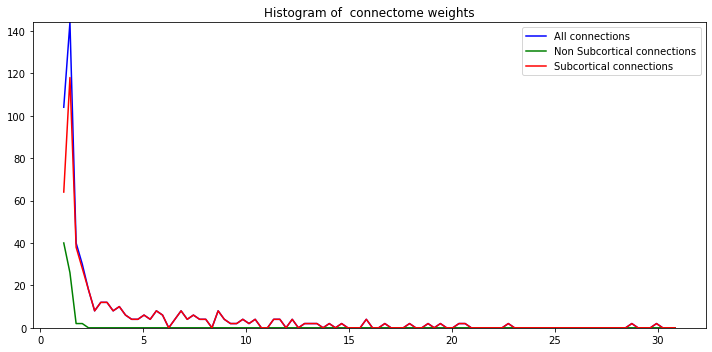

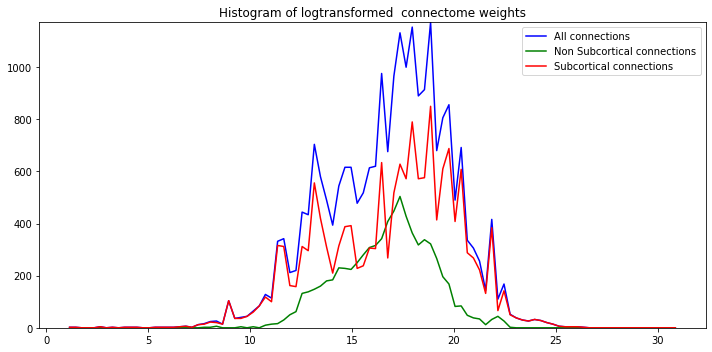

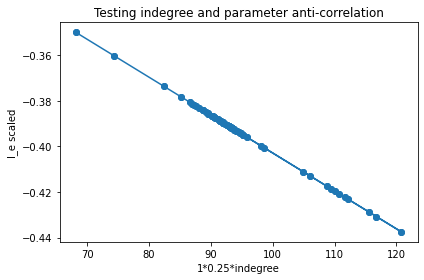

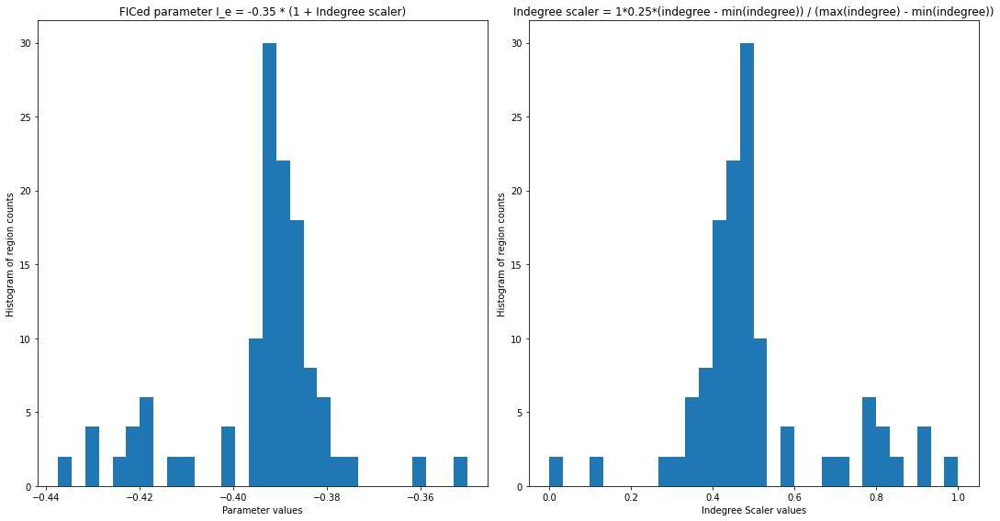

Applying FIC for parameter w_ie: G * FIC * (1.0-FIC_SPLIT) = 1 * 1 * 0.75 = 0.75!


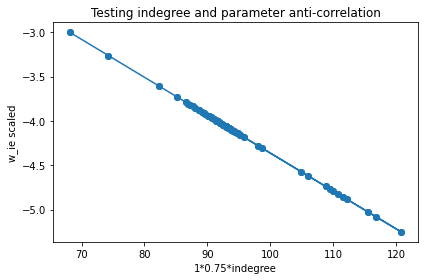

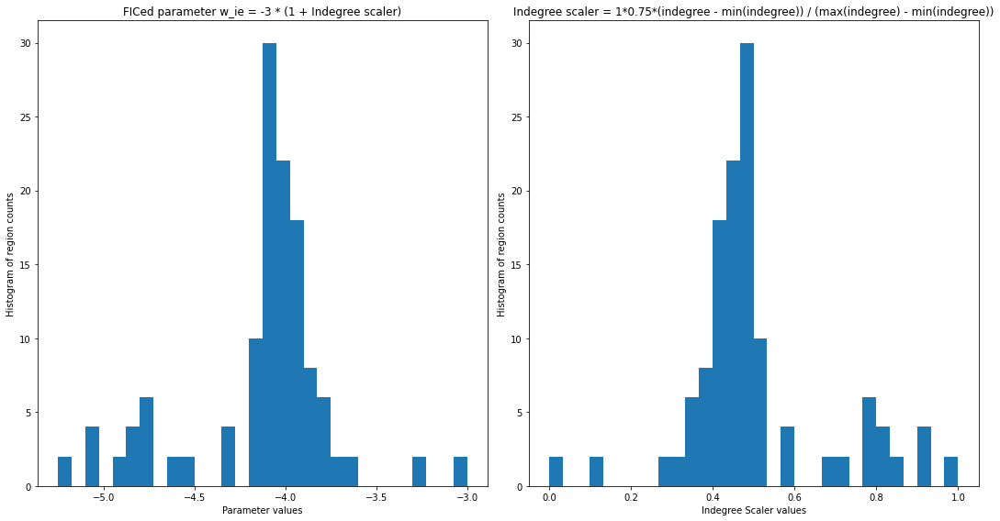

2022-12-02 17:05:30,789 - WARNING - tvb_multiscale.core.tvb.cosimulator.cosimulator_serial - Current step is not 0 upon configuration!
Setting it to 0. Initial condition might be affected!
Current step is not 0 upon configuration!
Setting it to 0. Initial condition might be affected!


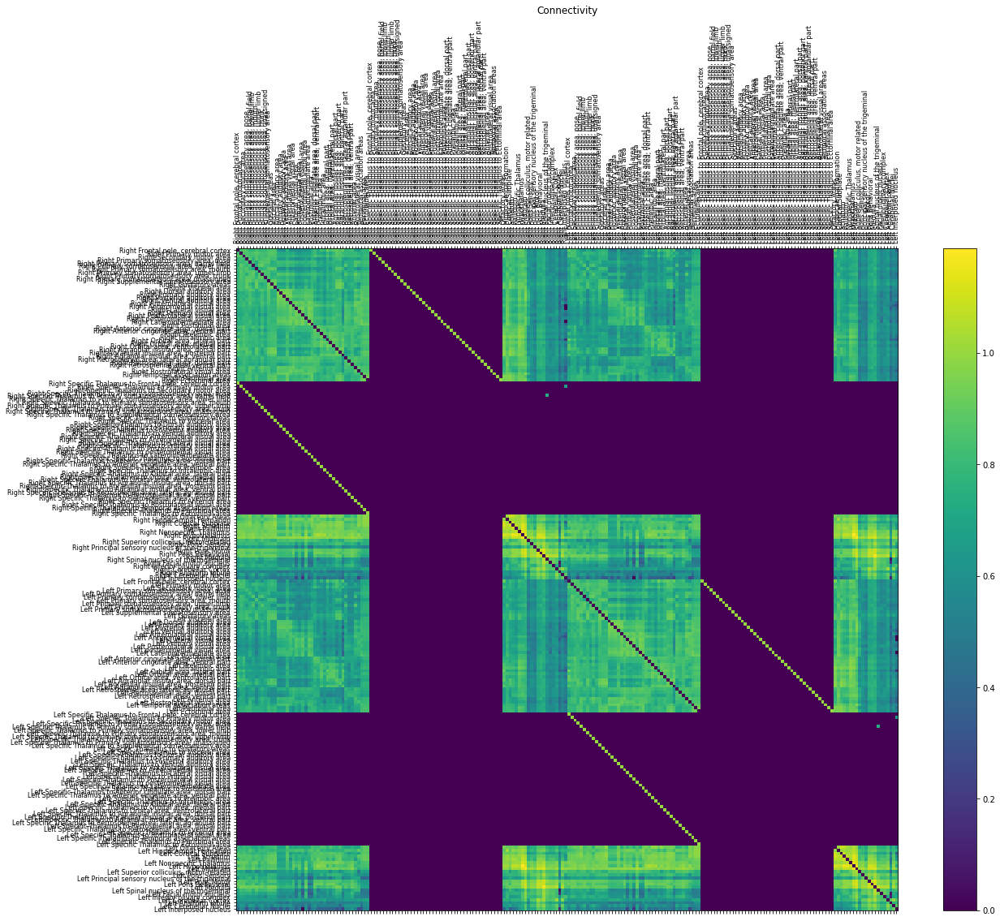

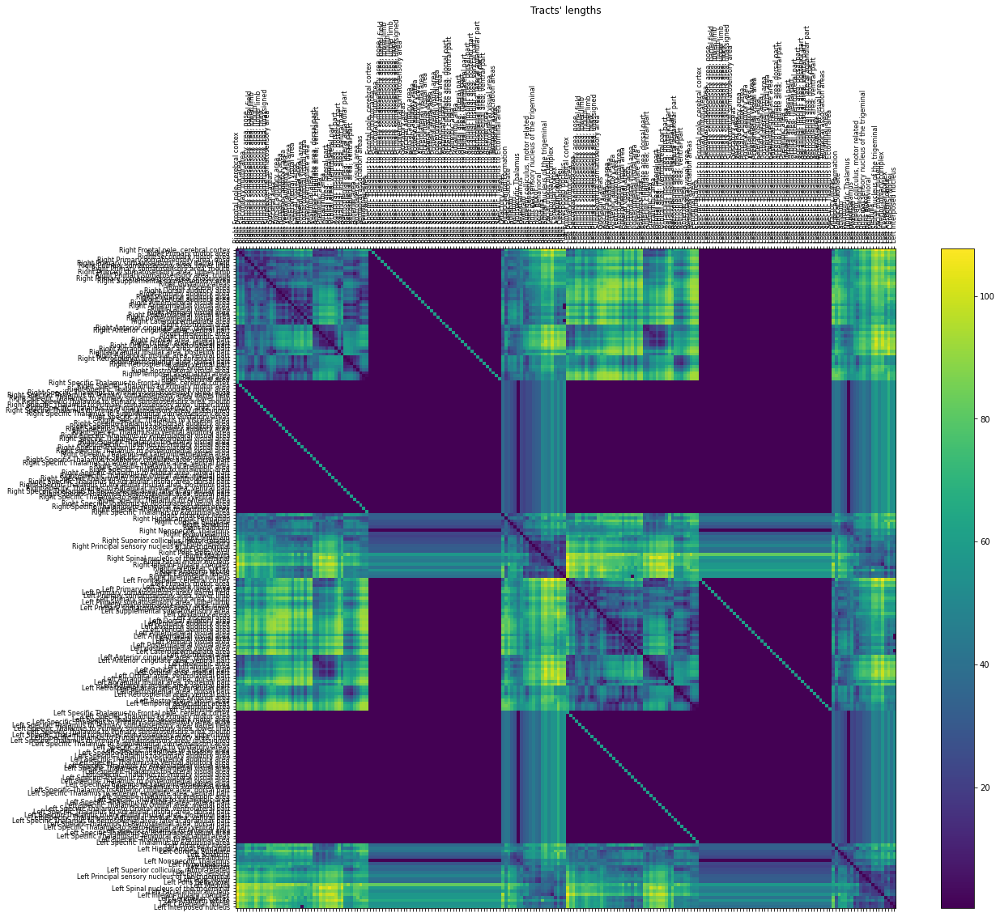

In [1]:
from examples.tvb_nest.notebooks.cerebellum.scripts.scripts import *

from examples.tvb_nest.notebooks.cerebellum.scripts.base import DEFAULT_ARGS

# Code repeating what is done in scripts.tvb_nest_script.run_tvb_nest_workflow() function:

# Inputs to run_tvb_nest_workflow()
PSD_target = None
model_params = {} # outputs/cwc_FIC_I_e_w_ie/code
config = None
write_files = True
config_args = {"output_folder": "tvb_nest_rs"}

plot_flag = config_args.get('plot_flag', DEFAULT_ARGS.get('plot_flag'))
config, plotter = assert_config(config, return_plotter=True, **config_args)
config.model_params.update(model_params)
if config.VERBOSE:
    print("\n\n------------------------------------------------\n\n"+
          "Running TVB-NEST workflow for plot_flag=%s, write_files=%s,\nand model_params=\n%s...\n" 
          % (str(plot_flag), str(write_files), str(config.model_params)))
# config.SIMULATION_LENGTH = 100.0

# Load and prepare connectome and connectivity with all possible normalizations:
connectome, major_structs_labels, voxel_count, inds, maps = prepare_connectome(config, plotter=plotter)
connectivity = build_connectivity(connectome, inds, config)

# Prepare model
model = build_model(connectivity.number_of_regions, inds, maps, config)

# Prepare simulator
simulator = build_simulator(connectivity, model, inds, maps, config, plotter=plotter)



In [2]:
simulator.model.G[0].item()

0.0078125

In [3]:
# Build NEST network
nest_network, nest_nodes_inds, neuron_models, neuron_number = build_NEST_network(config)



              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: HEAD@c545255f7
 Built: May 18 2022 09:50:55

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.

FAILED! Needing to compile it first!
Compiling cereb module...



-------------------------------------------------------
cerebmodule Configuration Summary
-------------------------------------------------------

C++ compiler         : /usr/bin/c++
Build static libs    : OFF
C++ compiler flags   : 
NEST compiler flags  :  -std=c++11 -O2 -Wall -fopenmp  -fdiagnostics-color=auto
NEST include dirs    :  -I/home/docker/env/neurosci/nest_build/include/nest -I/usr/include -I/usr/include -I/usr/include -I/usr/include
NEST libraries flags : -L/home/docker/env/neurosci/nest_build/lib/nest -lnestutil -lnest -lsli -lnestkernel -fopenmp /usr/lib/x86_64-linux-gnu/libltdl.so /usr/lib/x86_64-linux-gnu/libreadline.so /usr/lib/x86_64-linux-gnu/libncurses.so /usr/lib/x86_64-linux-gnu/libgsl.so /usr/lib/x86_64-linux-gnu/libgslcblas.so   /usr/lib/libmpicxx.so /usr/lib/libmpi.so

-------------------------------------------------------

You can now build and install 'cerebmodule' using
  make
  make install

The library file libcerebmodule.so will be installed to
  /home

(b'-- Configuring done\n-- Generating done\n-- Build files have been written to: /home/docker/packages/tvb-multiscale/tvb_multiscale/tvb_nest/nest/modules/cereb/build\n[ 50%] Built target cerebmodule_module\n[100%] Built target cerebmodule_lib\n[ 50%] Built target cerebmodule_module\n[100%] Built target cerebmodule_lib\nInstall the project...\n-- Install configuration: ""\n-- Up-to-date: /home/docker/env/neurosci/nest_build/cerebmodule.so\n', None)
Installing cereb module...
Building NESTNetwork...
2022-12-02 17:06:05,151 - INFO - tvb_multiscale.core.spiking_models.network - <class 'tvb_multiscale.tvb_nest.nest_models.network.NESTNetwork'> created!

Dec 02 17:06:05 SetStatus [Error]: 
    Variable data_path not set: Directory 'sim_data/' does not exist.
2022-12-02 17:06:05,151 - INFO - tvb_multiscale.core.spiking_models.network - <class 'tvb_multiscale.tvb_nest.nest_models.network.NESTNetwork'> created!
2022-12-02 17:06:07,674 - INFO - tvb_multiscale.core.spiking_models.devices - <clas

In [4]:
#nest.Install('cerebmodule')

In [5]:
# pwd=os.getcwd()
# import nest
# import subprocess
# cereb_path = '/home/docker/packages/tvb-multiscale/tvb_multiscale/tvb_nest/nest/modules/cereb'
# os.chdir(os.path.join(cereb_path, 'build'))
# p = subprocess.Popen("cmake -Dwith-nest=/home/docker/env/neurosci/nest_build/bin/nest-config ..; make; make install",
#                              stdout=subprocess.PIPE, shell=True)
# print(p.communicate())

# nest.Install('cerebmodule')
# os.chdir(pwd)

In [6]:
#before running the below code, make sure that you locally add the file here: 
# /home/docker/packages/tvb-multiscale/examples/data/cerebellum/balanced_DCN_IO.hdf5
# nest_network, nest_nodes_inds, neuron_models, neuron_number = build_NEST_network(config)

In [7]:
# nest_network.nest_instance.Simulate(config.SIMULATION_LENGTH)

# nest_network = simulate_nest_network(nest_network, config, neuron_models, neuron_number, plot_flag=True)


In [8]:
# Build TVB-NEST interfaces
simulator, nest_network = build_tvb_nest_interfaces(simulator, nest_network, nest_nodes_inds, config)


2022-12-02 17:06:08,426 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model inhomogeneous_poisson_generator for ['E']->['mossy_fibers'] created!
2022-12-02 17:06:08,426 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model inhomogeneous_poisson_generator for ['E']->['mossy_fibers'] created!
2022-12-02 17:06:08,437 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for ['granule_cell']->['E'] created!
2022-12-02 17:06:08,437 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for ['granule_cell']->['E'] created!
2022-12-02 17:06:08,454 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_re

In [9]:
# Confirming that we got our special coupling for the TVB->NEST interface CosimCouplingMonitor:
simulator.cosim_monitors[0].coupling


,value
Type,SigmoidalPreThalamoCortical
"a [min, median, max]","[20, 20, 20]"
a dtype,float64
a shape,"(1,)"
"cmax [min, median, max]","[1, 1, 1]"
cmax dtype,float64
cmax shape,"(1,)"
"cmin [min, median, max]","[0, 0, 0]"
cmin dtype,float64
cmin shape,"(1,)"


In [10]:
# Simulate TVB-NEST model
results, transient, simulator, nest_network = simulate_tvb_nest(simulator, nest_network, config)


Simulating TVB-NEST...
2022-12-02 17:06:10,762 - ERROR - tvb_multiscale.core.tvb.cosimulator.cosimulator_serial - Bad Simulator.integrator.noise.nsig shape: (2, 1, 1)
2022-12-02 17:06:10,778 - WARNING - tvb_multiscale.core.tvb.cosimulator.cosimulator_serial - Current step is not 0 upon configuration!
Setting it to 0. Initial condition might be affected!
Current step is not 0 upon configuration!
Setting it to 0. Initial condition might be affected!
...1.773% completed in 11.1146 sec!!

/home/docker/env/neurosci/lib/python3.9/site-packages/elephant/conversion.py:1170: UserWarning:Binning discarded 2 last spike(s) of the input spiketrain


...1.862% completed in 11.6798 sec!

/home/docker/env/neurosci/lib/python3.9/site-packages/elephant/conversion.py:1170: UserWarning:Binning discarded 1 last spike(s) of the input spiketrain


...1.950% completed in 12.2594 sec!

/home/docker/env/neurosci/lib/python3.9/site-packages/elephant/conversion.py:1170: UserWarning:Binning discarded 3 last spike(s) of the input spiketrain
/home/docker/env/neurosci/lib/python3.9/site-packages/elephant/conversion.py:1170: UserWarning:Binning discarded 11 last spike(s) of the input spiketrain


...2.039% completed in 12.8382 sec!

/home/docker/env/neurosci/lib/python3.9/site-packages/elephant/conversion.py:1170: UserWarning:Binning discarded 6 last spike(s) of the input spiketrain


...3.014% completed in 19.3197 sec!

/home/docker/env/neurosci/lib/python3.9/site-packages/elephant/conversion.py:1170: UserWarning:Binning discarded 8 last spike(s) of the input spiketrain


...3.546% completed in 22.7952 sec!

/home/docker/env/neurosci/lib/python3.9/site-packages/elephant/conversion.py:1170: UserWarning:Binning discarded 4 last spike(s) of the input spiketrain


...7.092% completed in 46.0511 sec!

/home/docker/env/neurosci/lib/python3.9/site-packages/elephant/conversion.py:1170: UserWarning:Binning discarded 5 last spike(s) of the input spiketrain


...30.319% completed in 197.291 sec!

/home/docker/env/neurosci/lib/python3.9/site-packages/elephant/conversion.py:1170: UserWarning:Binning discarded 7 last spike(s) of the input spiketrain


...100.000% completed in 666.249 sec!
Simulated in 669.165813 secs!


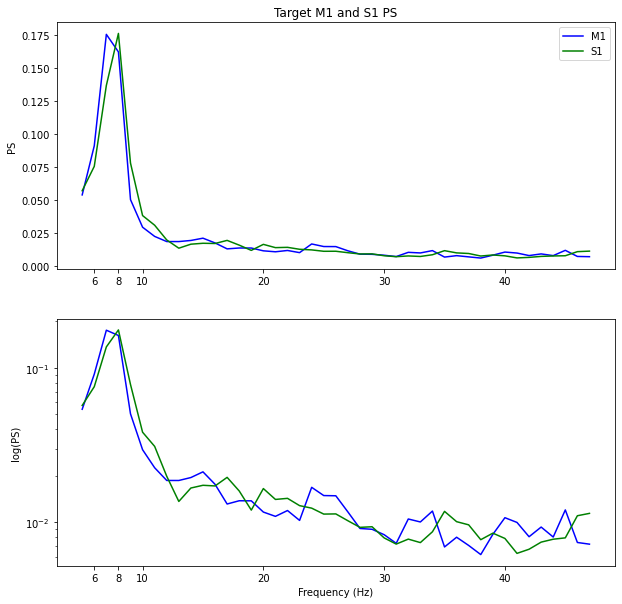

In [11]:
if PSD_target is None:
    # This is the PSD target we are trying to fit...
    if config.model_params['G']:
            # ...for a connected brain, i.e., PS of bilateral M1 and S1:
        PSD_target = compute_target_PSDs_m1s1brl(config, write_files=True, plotter=plotter)
    else:
        # ...for a disconnected brain, average PS of all regions:
        PSD_target = compute_target_PSDs_1D(config, write_files=True, plotter=plotter)

/home/docker/packages/tvb-multiscale/examples/tvb_nest/notebooks/cerebellum/scripts/tvb_script.py:715: UserWarning:H5Writer cannot be imported! Probably you haven't installed tvb_framework.


Pickle-dumping source_ts to /home/docker/packages/tvb-multiscale/examples/tvb_nest/notebooks/cerebellum/working_files/outputs/tvb_nest_rs/res/source_ts.pkl!
Pickle-dumping bold_ts to /home/docker/packages/tvb-multiscale/examples/tvb_nest/notebooks/cerebellum/working_files/outputs/tvb_nest_rs/res/bold_ts.pkl!


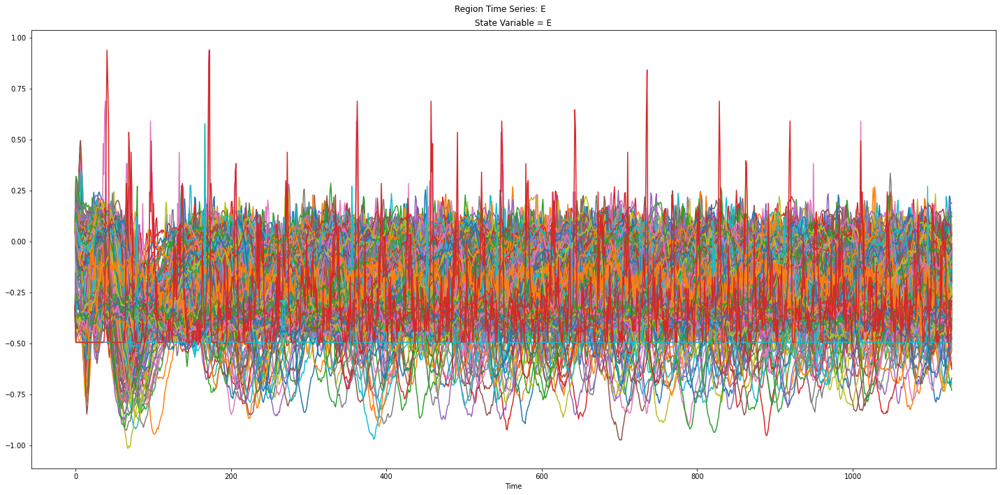

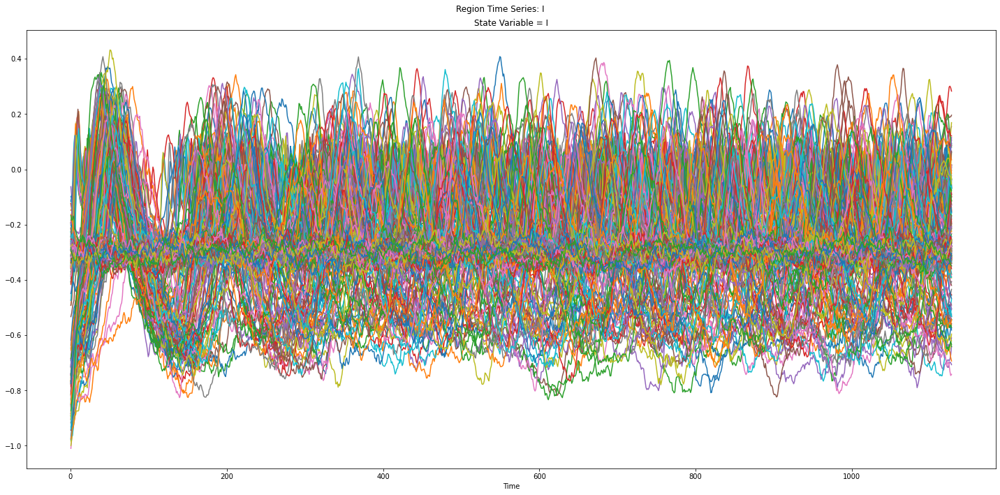

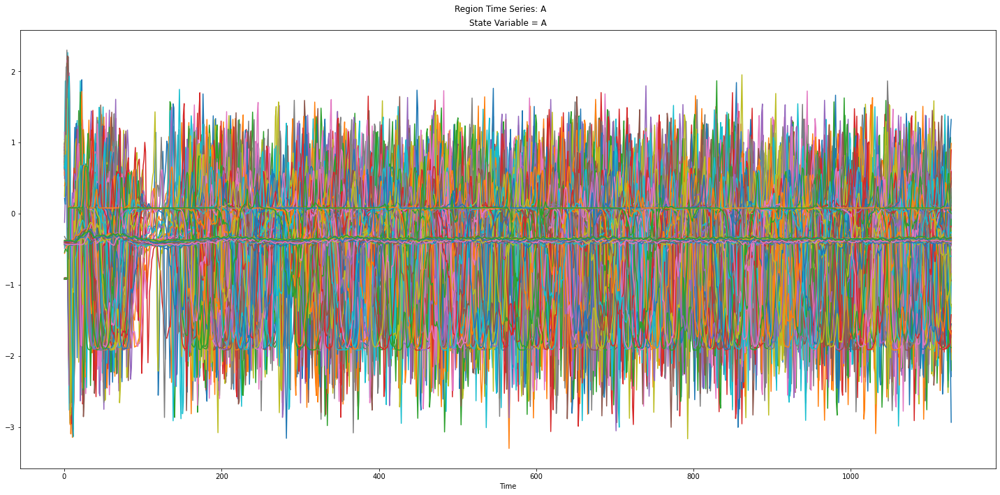

2022-12-02 17:17:24,265 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:24,266 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:17:24,272 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:24,273 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


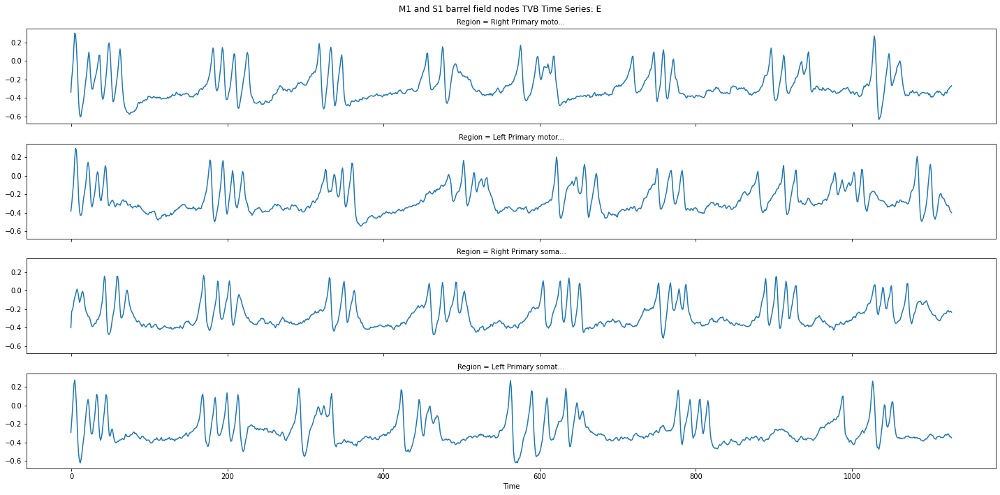

2022-12-02 17:17:24,934 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:24,935 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


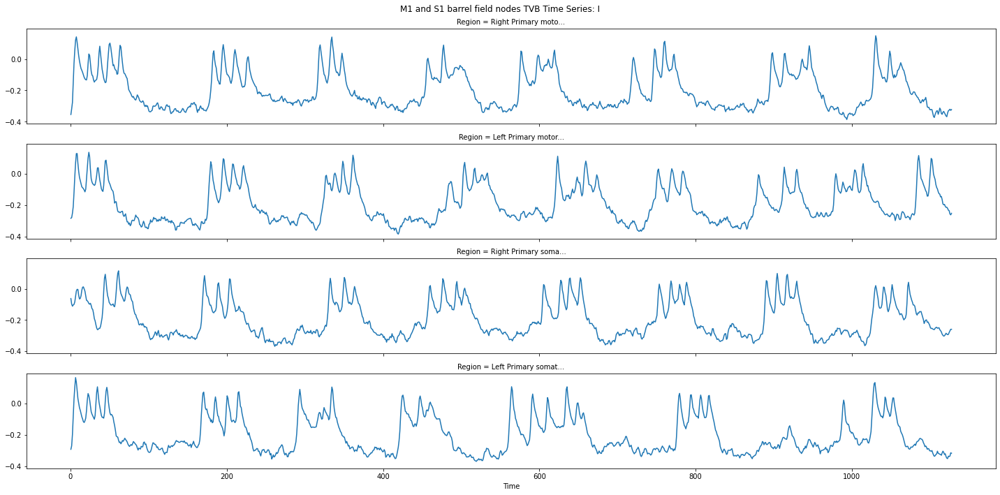

2022-12-02 17:17:25,575 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:25,576 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


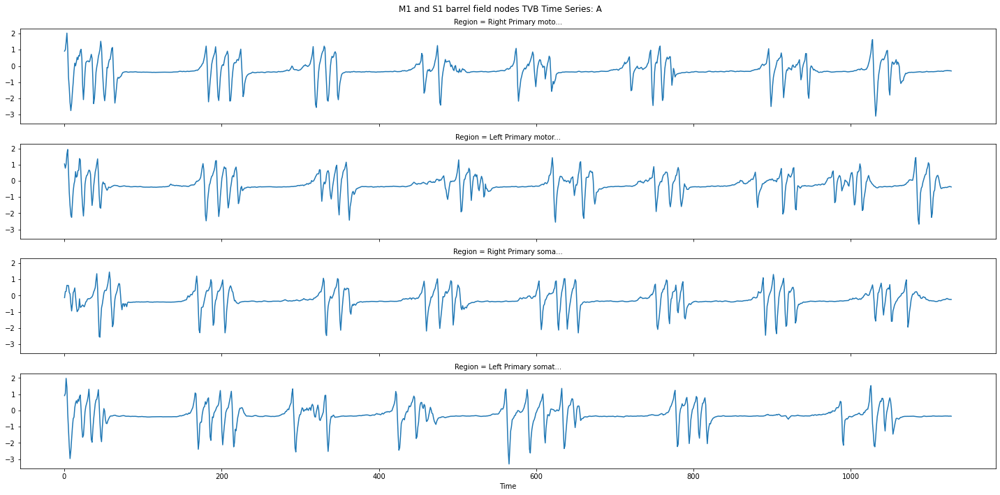

2022-12-02 17:17:26,249 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:26,251 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:17:26,258 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:26,259 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


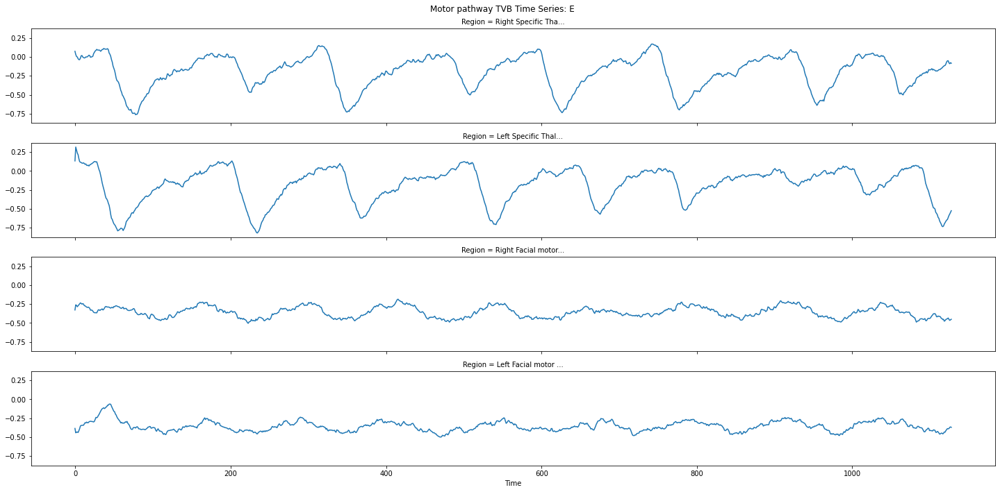

2022-12-02 17:17:26,883 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:26,886 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


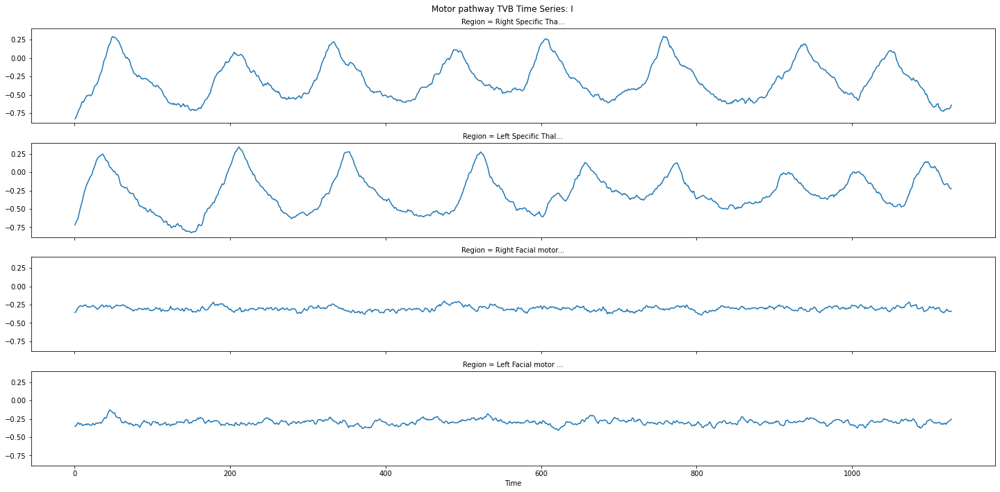

2022-12-02 17:17:27,555 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:27,556 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


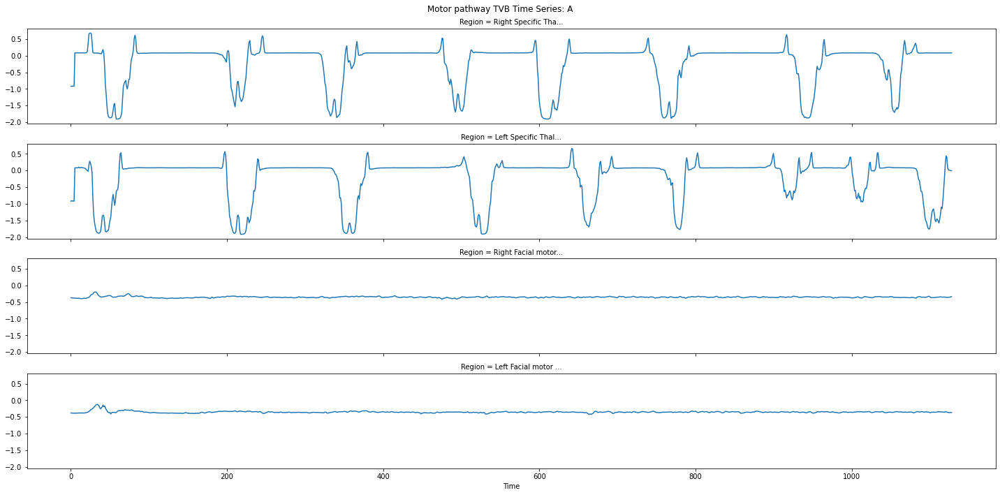

2022-12-02 17:17:28,306 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:28,307 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:17:28,314 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:28,315 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


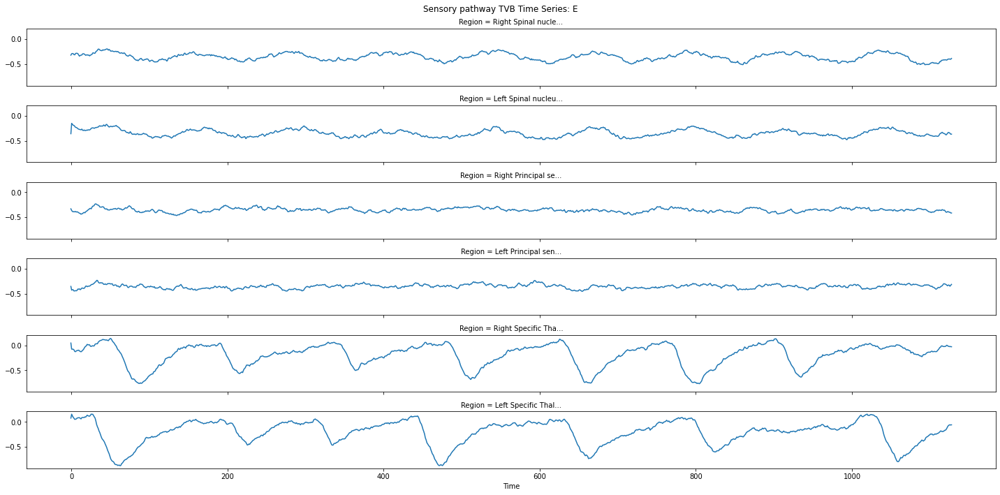

2022-12-02 17:17:29,323 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:29,324 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


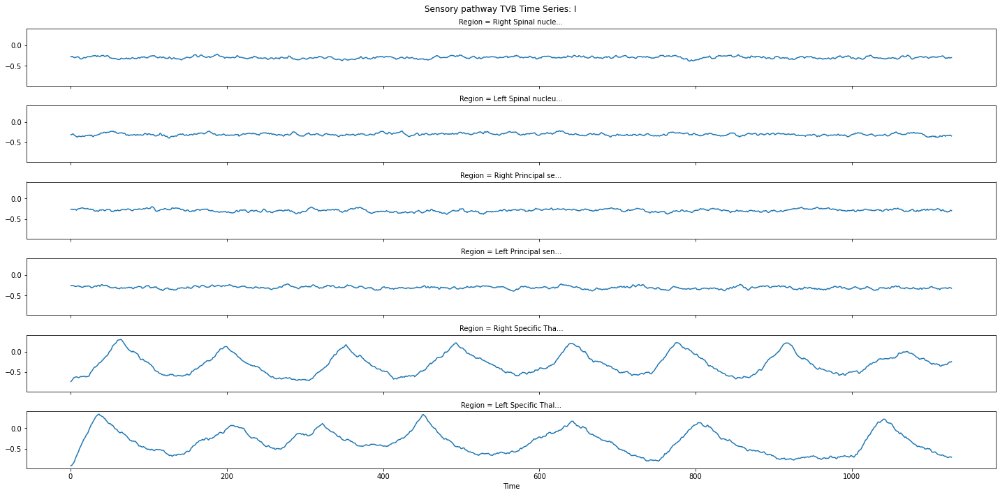

2022-12-02 17:17:30,099 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:30,101 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


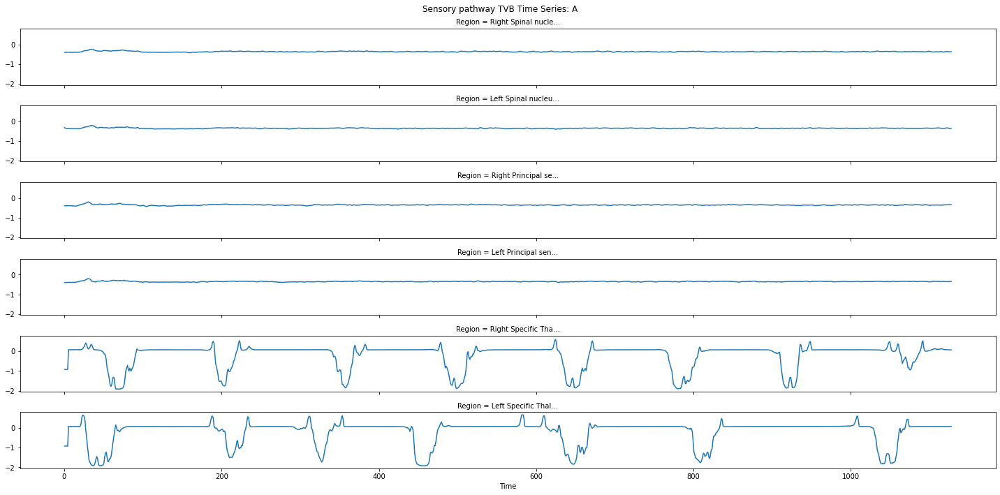

2022-12-02 17:17:30,923 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:30,925 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:17:30,933 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:30,934 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


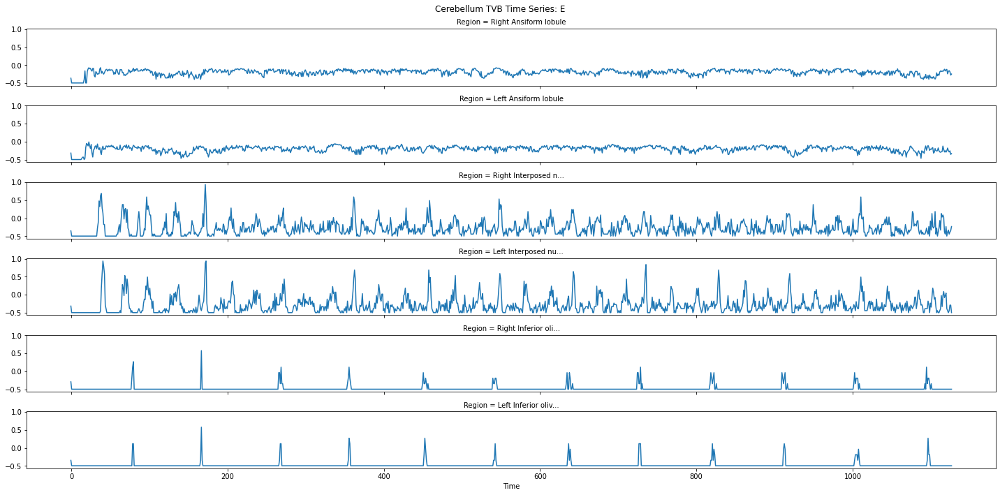

2022-12-02 17:17:31,810 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:31,811 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


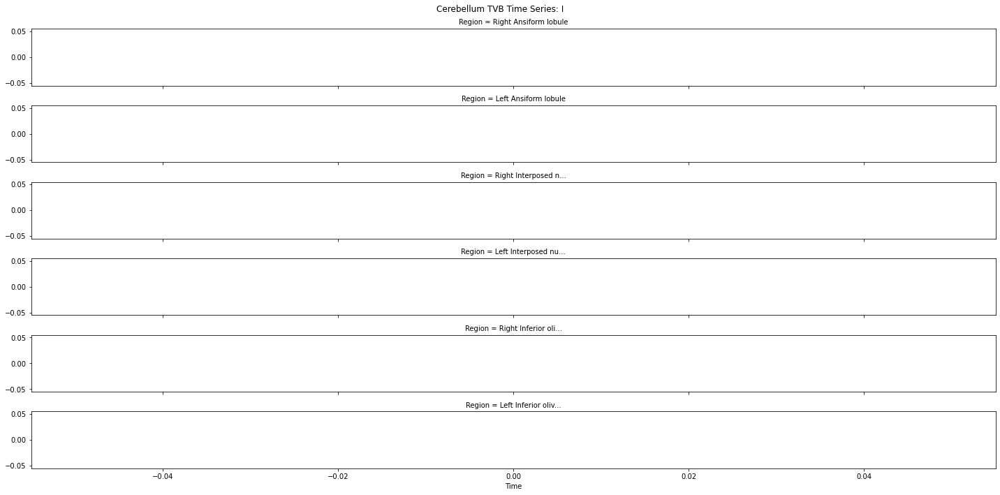

2022-12-02 17:17:32,557 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:32,559 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


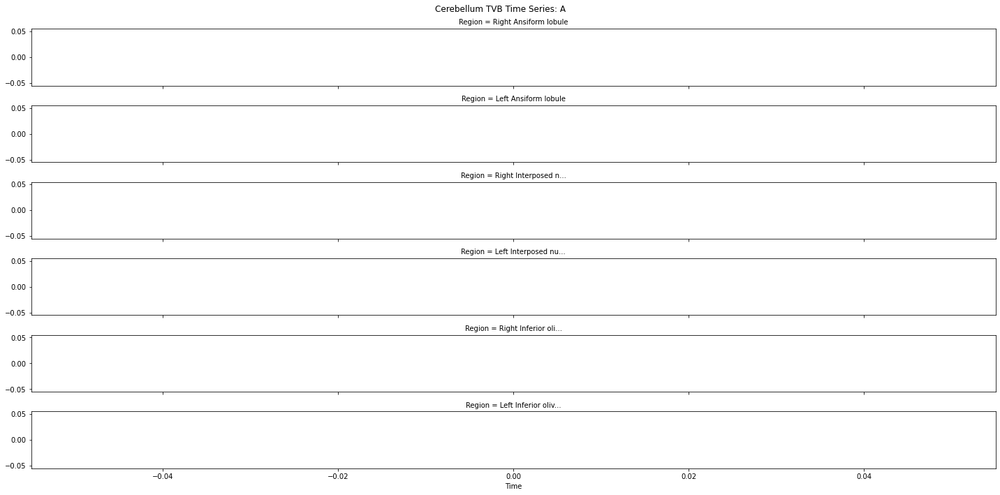

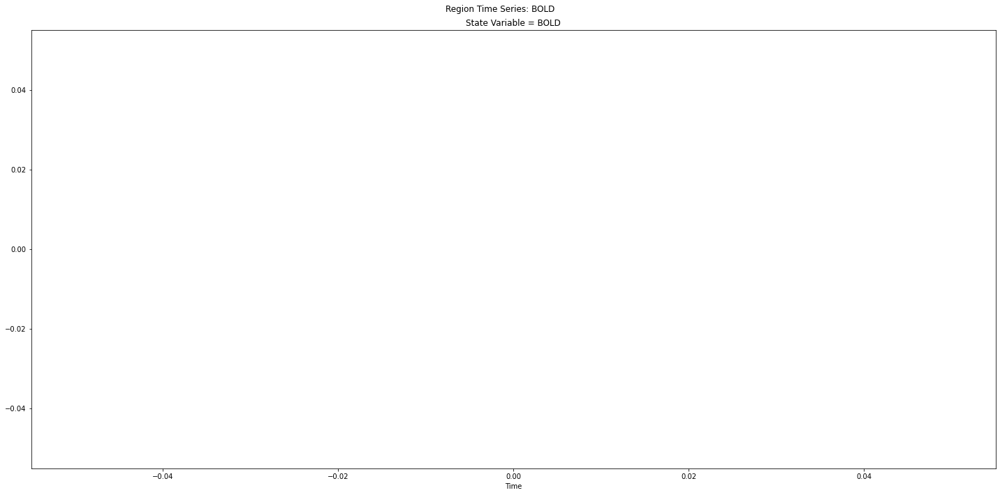

2022-12-02 17:17:33,718 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:33,719 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


/home/docker/env/neurosci/lib/python3.9/site-packages/scipy/signal/_spectral_py.py:1961: UserWarning:nperseg = 2048 is greater than input length  = 1026, using nperseg = 1026


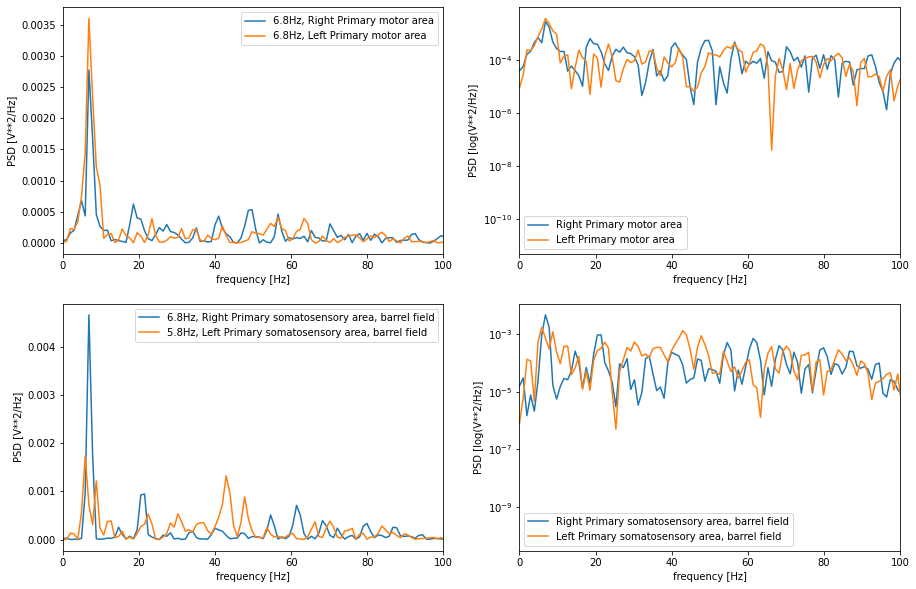

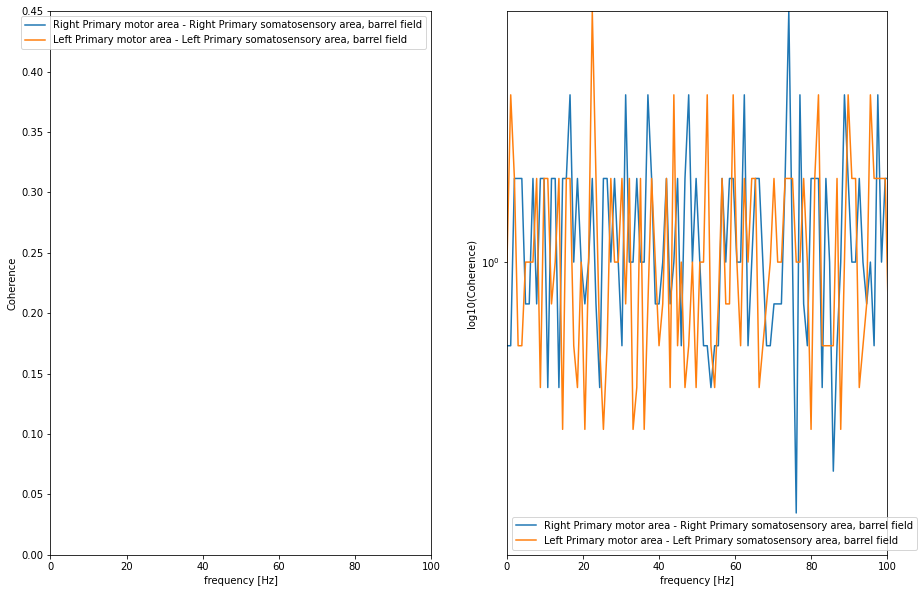

2022-12-02 17:17:35,129 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:17:35,130 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!


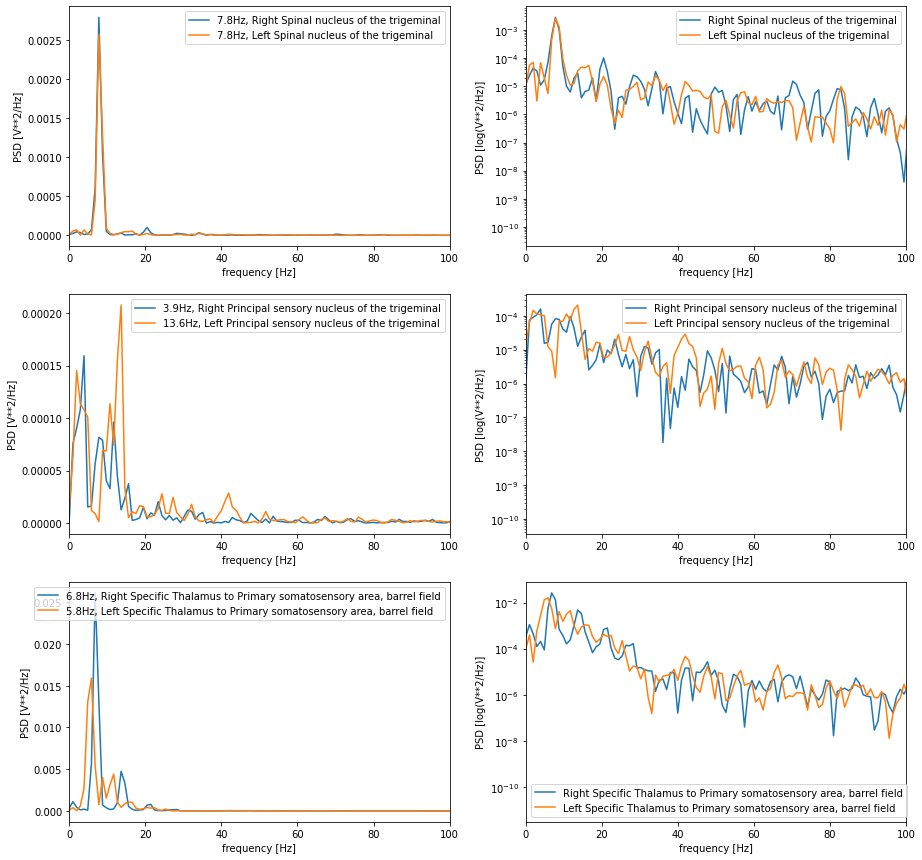

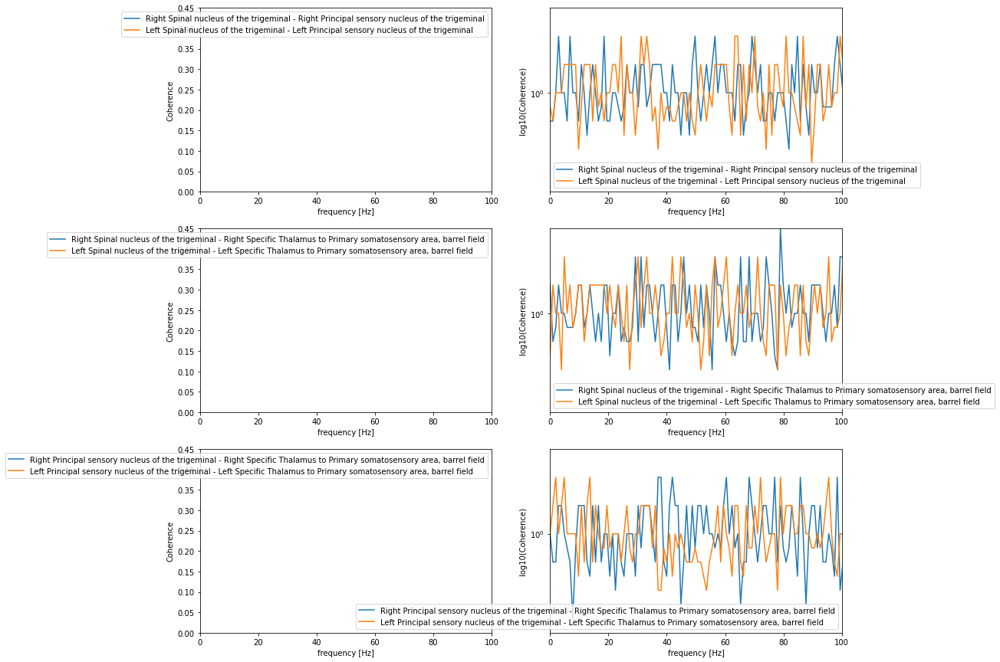

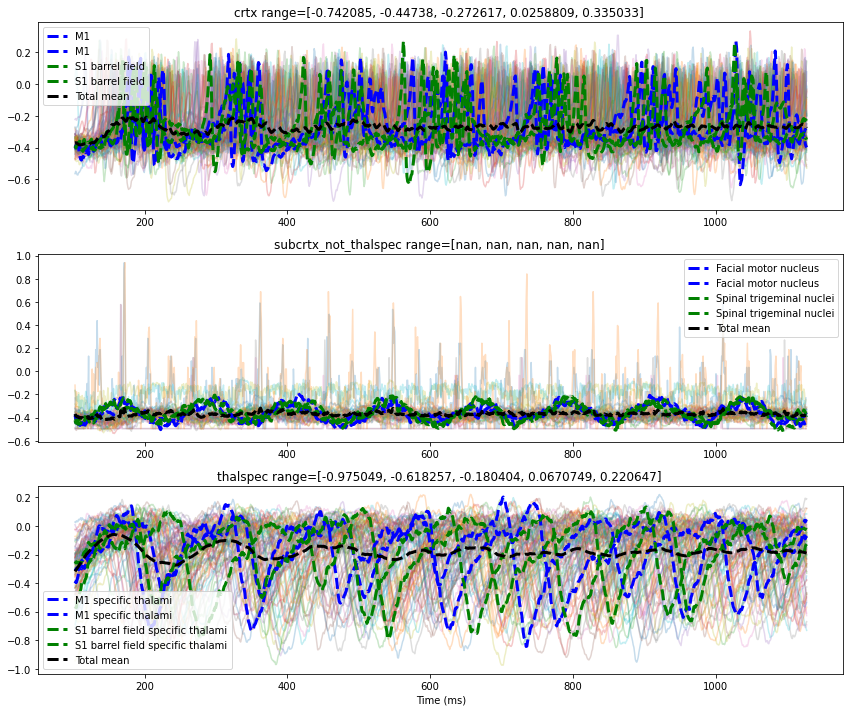

In [12]:
source_ts = plot_tvb(transient, inds, results=results, source_ts=None, bold_ts=None,
                     simulator=simulator, plotter=plotter, config=config, write_files=write_files)[0]

2022-12-02 17:29:02,769 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model  for  created!
2022-12-02 17:29:02,769 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model  for  created!
2022-12-02 17:29:08,728 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:29:08,729 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:29:08,803 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:29:08,804 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:29:08,834 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable


/home/docker/env/neurosci/lib/python3.9/site-packages/elephant/conversion.py:1170: UserWarning:Binning discarded 15 last spike(s) of the input spiketrain


2022-12-02 17:29:09,233 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:29:09,234 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:29:09,269 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:29:09,270 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:29:09,302 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:29:09,303 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:29:09,339 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:29:09,340 - WARNING - tvb.contrib.scripts.da

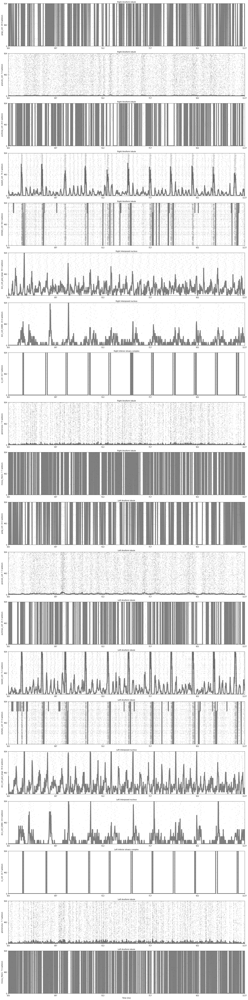

Mean spike rates:
golgi_cell - Left Ansiform lobule: 19.3077
golgi_cell - Right Ansiform lobule: 18.8619
granule_cell - Left Ansiform lobule: 7.26478
granule_cell - Right Ansiform lobule: 7.41231
purkinje_cell - Left Ansiform lobule: 20.3202
purkinje_cell - Right Ansiform lobule: 20.5074
basket_cell - Left Ansiform lobule: 71.2578
basket_cell - Right Ansiform lobule: 74.3026
stellate_cell - Left Ansiform lobule: 57.0111
stellate_cell - Right Ansiform lobule: 58.3026
dcn_cell_glut_large - Left Interposed nucleus: 30.6222
dcn_cell_glut_large - Right Interposed nucleus: 30.5391
dcn_cell_GABA - Left Interposed nucleus: 14.3704
dcn_cell_GABA - Right Interposed nucleus: 14.6013
io_cell - Left Inferior olivary complex: 10.7265
io_cell - Right Inferior olivary complex: 10.7265
glomerulus - Left Ansiform lobule: 7.7322
glomerulus - Right Ansiform lobule: 7.87329
mossy_fibers - Left Ansiform lobule: 7.62605
mossy_fibers - Right Ansiform lobule: 7.69272
<xarray.DataArray "Populations' Spikes' Cor

2022-12-02 17:38:04,264 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:38:04,265 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:38:04,296 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:38:04,297 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:38:04,336 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:38:04,337 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - Connectivity and RegionTimeSeries labels agreement failed!
2022-12-02 17:38:04,371 - WARNING - tvb.contrib.scripts.datatypes.time_series_xarray - 'NoneType' object is not subscriptable
2022-12-02 17:38:04,372 - WARNING - tvb.contrib.scripts.da

<Figure size 432x288 with 0 Axes>

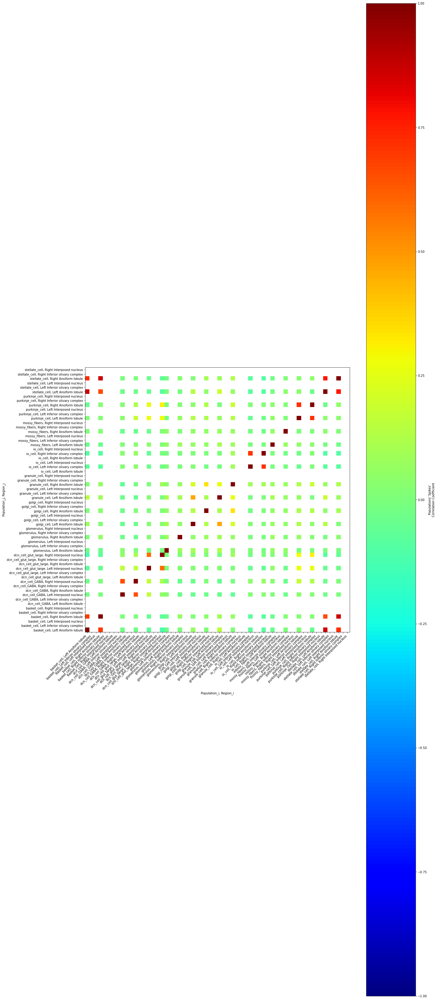

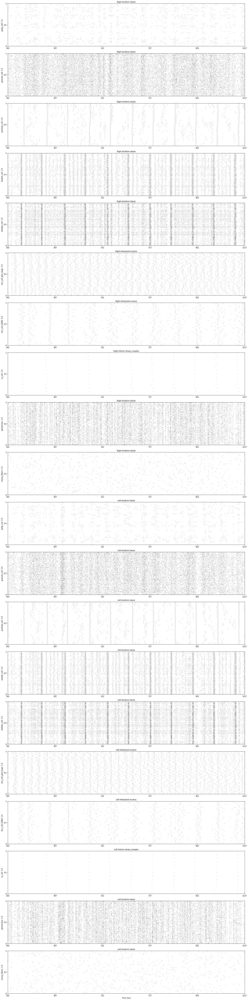

2022-12-02 17:38:09,369 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model  for  created!
2022-12-02 17:38:09,369 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model  for  created!
2022-12-02 17:38:09,385 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model  for  created!
2022-12-02 17:38:09,385 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model  for  created!
2022-12-02 17:38:09,404 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model  for  created!
2022-12-02 17:38:09,404 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model  for  created!
2022-12-02

In [39]:
# These plots can take a lot of time!!!
from examples.plot_write_results import plot_write_spiking_network_results
config.figures.DEFAULT_SIZE = (20, 80)
plot_write_spiking_network_results(nest_network, connectivity=connectivity,
                                   time=source_ts.time, transient=transient, monitor_period=simulator.monitors[0].period,
                                   plot_per_neuron=False, plotter=plotter, writer=None, config=config)

In [14]:
# Get spike events from NEST spike recorders
events = nest_network.output_devices['mossy_fibers']['Right Ansiform lobule'].get_events()

In [15]:
events

{'times': array([   5.95,    6.5 ,    7.65, ..., 1124.4 , 1125.95, 1128.7 ]),
 'senders': array([62805., 62802., 62804., ..., 62803., 62844., 62861.])}

In [16]:
# Compute approximate average rate of mossy fibers as:
# number_of_spikes / (number_of_neurons * time_length_in_ms) * 1000 (to convert to spikes/sec)

print("Last spike time: %g" % events['times'][-1])

for duration in range(1000, 10000, 1000):
    # duration = 1000.0  
    n_spikes = np.sum(events['times'] > events['times'][-1] - duration)
    print("Approximate mossy_fibers rate during the last %g ms = %g" % 
          (duration, n_spikes / 
                      (nest_network.output_devices['mossy_fibers']['Right Ansiform lobule'].number_of_neurons 
                       * duration) * 1000))



Last spike time: 1128.7
Approximate mossy_fibers rate during the last 1000 ms = 7.75214
Approximate mossy_fibers rate during the last 2000 ms = 4.4359
Approximate mossy_fibers rate during the last 3000 ms = 2.95726
Approximate mossy_fibers rate during the last 4000 ms = 2.21795
Approximate mossy_fibers rate during the last 5000 ms = 1.77436
Approximate mossy_fibers rate during the last 6000 ms = 1.47863
Approximate mossy_fibers rate during the last 7000 ms = 1.2674
Approximate mossy_fibers rate during the last 8000 ms = 1.10897
Approximate mossy_fibers rate during the last 9000 ms = 0.985755


In [17]:
# Node coupling values towards all regions for the last synchronization time:
node_coupling = simulator._loop_compute_node_coupling(simulator.current_step)
# min, mean, max values to get a feeling of scale:
print([node_coupling.min(), node_coupling.mean(), node_coupling.max()])
print(node_coupling[0][inds["ansilob"]])  # node_coupling[cvar, region_id, mode]
print(node_coupling[0][inds["oliv"]])

[nan, nan, nan]
[[3.912568 ]
 [4.7573986]]
[[4.047426]
 [2.885407]]


In [18]:
# The last values in the TVB -> NEST transformer input buffer 
# (i.e., node couplines towards mossy fibers region nodes, i.e., towards Ansiform Lobule)
simulator.output_interfaces.interfaces[0].transformer.input_buffer
# simulator.input_interfaces.interfaces[0].transformer.input_buffer

array([[3.356947 , 3.4016247, 3.4644923, 3.6167927, 3.652008 , 3.7643442,
        3.8818588, 3.9631853, 3.91888  , 3.912568 ],
       [3.817692 , 3.8960047, 3.9922721, 4.121623 , 4.2904816, 4.3742905,
        4.433885 , 4.602591 , 4.675507 , 4.7573986]], dtype=float32)

In [19]:
# Transformer output buffer rates, after scaling in the transformer with the scale_factor parameter
simulator.output_interfaces.interfaces[0].transformer.output_buffer
# simulator.input_interfaces.interfaces[0].transformer.output_buffer


array([[1.9669611, 1.9931395, 2.029976 , 2.1192145, 2.1398485, 2.2056704,
        2.2745266, 2.3221788, 2.2962186, 2.2925203],
       [2.236929 , 2.2828152, 2.339222 , 2.4150136, 2.5139542, 2.5630608,
        2.5979795, 2.6968307, 2.739555 , 2.7875383]], dtype=float32)

In [20]:
# The rates that were transferred to the corresponding spike generator device in NEST:
simulator.output_interfaces.interfaces[0].proxy.target[0].Get()
# simulator.input_interfaces.interfaces[0].proxy.source[0].Get()

{'allow_offgrid_times': True,
 'element_type': 'stimulator',
 'frozen': False,
 'global_id': 63825,
 'label': '',
 'local': True,
 'model': 'inhomogeneous_poisson_generator',
 'node_uses_wfr': False,
 'origin': 0.0,
 'rate_times': array([1128.05, 1128.15, 1128.25, 1128.35, 1128.45, 1128.55, 1128.65,
        1128.75, 1128.85, 1128.95]),
 'rate_values': array([1.96696115, 1.99313951, 2.02997589, 2.11921453, 2.13984847,
        2.20567036, 2.2745266 , 2.32217884, 2.29621863, 2.29252028]),
 'start': 0.0,
 'stimulus_source': '0',
 'stop': 1.7976931348623157e+308,
 'thread': 0,
 'thread_local_id': 63824,
 'vp': 0}

In [21]:
# !!!TAKES TOO MUCH TIME AND FREEZES KERNEL!!!
# plot_nest_results(nest_network, neuron_models, neuron_number, config)

In [22]:
simulator.input_interfaces.interfaces[0].transformer.input_buffer[0]

array([1126.85, 1126.55, 1126.05, 1126.55, 1126.4 , 1126.45, 1126.2 ,
       1126.45, 1127.  , 1126.7 , 1126.9 , 1126.5 , 1126.75, 1126.55])

In [23]:
simulator.input_interfaces.interfaces[0].transformer.output_buffer

array([[-0.16591796, -0.49517188, -0.16591796, -0.49517188, -0.10722829,
        -0.09085308, -0.49517188, -0.12941639, -0.16591796, -0.16591796],
       [-0.49517188, -0.49517188, -0.16591796, -0.16591796, -0.49517188,
        -0.16591796, -0.49517188, -0.16591796, -0.49517188, -0.16591796]])

[-0.49517188  1.03616329]


/tmp/ipykernel_658/1875387785.py:2: RuntimeWarning:divide by zero encountered in log


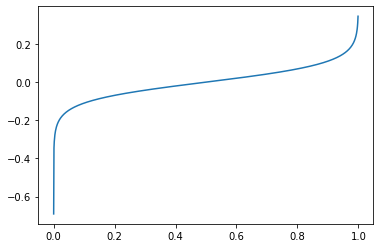

In [40]:
# The inverse sigmoidal transformation assuming:
# sigma = 0.0, w = 1.0, fmin = 0.1, beta = 20.0
ft = lambda rate: 0.0 - np.log(1.0 / np.minimum(np.maximum(1.0 * rate, 0.000001), 1.0) - 1) / 20.0
x = np.arange(0.0, 1.001, 0.001)
fs = ft(x)
from matplotlib import pyplot as pl
pl.plot(x, fs)
# Min and max values of the inverse sigmoidal transformation
print(ft(np.array([0.5*1e-4, 1.0-1e-9])))

In [ ]:
len(simulator.input_interfaces.interfaces[0].proxy.source[0].connections)

In [32]:
simulator.input_interfaces.interfaces[2].transformer

,value
title,'ElephantSpikesHistogramRateThalamoCorticalWCInverseSigmoidal gid: 6343b3d5-298e-4cc4-96fd-c79bb06a61bb'
Type,'ElephantSpikesHistogramRateThalamoCorticalWCInverseSigmoidal'
time_unit: shape,()
time_unit: dtype,float64
time_unit: values,1.0
rate_unit: shape,()
rate_unit: dtype,float64
rate_unit: values,1.0
shape,"(2, 0)"
dtype,object
